## Setup

In [128]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

deg2rad = lambda  x: x * np.pi/180
rad2deg = lambda  x: x * 180 / np.pi

def display_one(image, title = 'Image', cmap = 'gray'):
    fig = plt.figure( figsize=(25,15));
    cs = plt.imshow(image, cmap=cmap)
    fig.colorbar(cs, shrink=0.7, aspect=30, fraction=0.05)
    if cmap == 'gray':
        plt.clim(0,1)
    else:
        plt.clim(0,255)
    plt.title(title)
    plt.show()    
    return

def display_arctan(image, title = 'Image', cmap = 'jet' , clim = (0,np.pi/2)):
    fig = plt.figure( figsize=(25,15));
    cs = plt.imshow(image, cmap=cmap)
    fig.colorbar(cs, shrink=0.7, aspect=30, fraction=0.05)
    plt.clim(clim)
    plt.title(title)
    plt.show()    
    return

def display_two(image1, image2, title1='Original Image', title2 = 'Result Image'):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image1)
    ax1.set_title(title1, fontsize=20)
    ax2.imshow(image2, cmap='gray')
    ax2.set_title(title2, fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return

In [7]:
    
# Read in an image and grayscale it
image = mpimg.imread('signs_vehicles_xygrad.png')

## Sobel Functions

### `abs_sobel_thresh()`

In [87]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=20, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3 , thresh=(0, 255), display = False):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    x_sobel = 1 if orient == 'x' else 0
    y_sobel = 1 if x_sobel == 0 else 0
    print(x_sobel, y_sobel)
    sobel = cv2.Sobel(gray, cv2.CV_64F, x_sobel, y_sobel, ksize = sobel_kernel)
        
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8    
    scaled_sobel = np.uint8(255 * abs_sobel / abs_sobel.max())
    print('sobel       : ', sobel.shape, sobel.min(), sobel.max())
    print('scaled_sobel: ', scaled_sobel.shape, scaled_sobel.min(), scaled_sobel.max())
    print('abs_sobel   : ', abs_sobel.shape, abs_sobel.min(), abs_sobel.max())
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    filtered_sobel = np.copy(scaled_sobel)
    filtered_sobel[(scaled_sobel < thresh[0]) | (scaled_sobel > thresh[1])] = 0
    
    if display:
        display_one(scaled_sobel , title='scaled_sobel - orientation: '+orient+'  thresholds: '+str(thresh), cmap='jet')
        display_one(filtered_sobel, title='filtered_sobel - orientation: '+orient+' within thresholds: '+str(thresh), cmap='jet')
        display_one(binary_output, title='result image - orientation: '+orient+'  thresholds: '+str(thresh))
    return binary_output

### `mag_thresh()` - Magnitude of Gradient Function

In [66]:
 # Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, thresh=(0, 255), display = False):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    thresh_min, thresh_max = thresh
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)    
    
    # 3) Calculate the magnitude 
    abs_sobel = np.sqrt((np.absolute(sobel_x )** 2) + (np.absolute(sobel_y) ** 2))
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / abs_sobel.max())
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image    
    filtered_sobel = np.copy(scaled_sobel)
    filtered_sobel[(scaled_sobel < thresh[0]) | (scaled_sobel > thresh[1])] = 0
    if display:
        display_one(scaled_sobel , title='scaled_sobel - thresholds: '+str(thresh), cmap='jet')
        display_one(filtered_sobel, title='filtered_sobel - within thresholds: '+str(thresh), cmap='jet')
        display_one(binary_output, title='result image - thresholds: '+str(thresh))    
    return binary_output



### `dir_thresh()` - Magnitude of Gradient Function

In [141]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2), display = False):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_x = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel))
    abs_sobel_y = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel))
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobel_y, abs_sobel_x)
    print("grad_dir:", grad_dir.shape, grad_dir.min(), grad_dir.max())
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
#     scaled_sobel = np.uint8(255 * abs_sobel / abs_sobel.max())

    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(grad_dir)
    binary_output[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image    

    filtered_dir = np.copy(grad_dir)
    filtered_dir[(grad_dir < thresh[0]) | (grad_dir > thresh[1])] = 0
    
    if display:
        display_arctan(grad_dir , title='gradient direction' )
        display_arctan(filtered_dir, title='filtered_grad - within thresholds: '+str(thresh) )
        display_one(binary_output, title='result image - thresholds: '+str(thresh))    
    return binary_output

## `abs_sobel_thresh()`

### x sobel detections

1 0
sobel       :  (720, 1280) -5430653902.976696 4479259918.09369
scaled_sobel:  (720, 1280) 0 254
abs_sobel   :  (720, 1280) 0.0 5430653902.976696


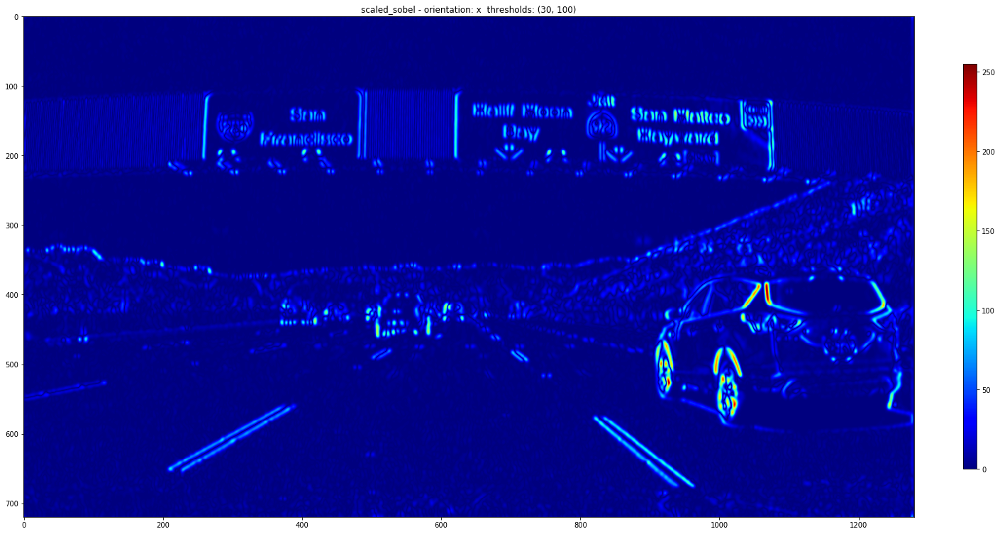

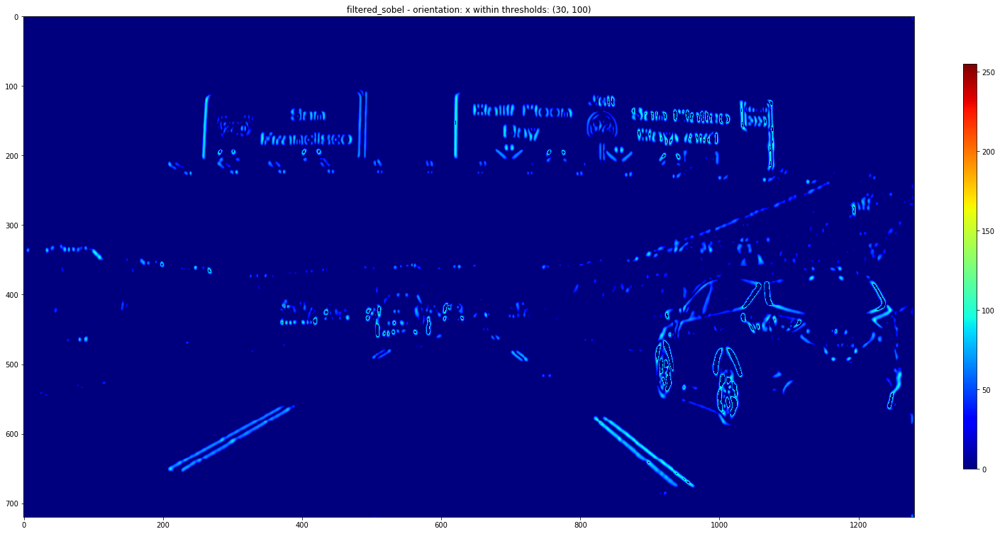

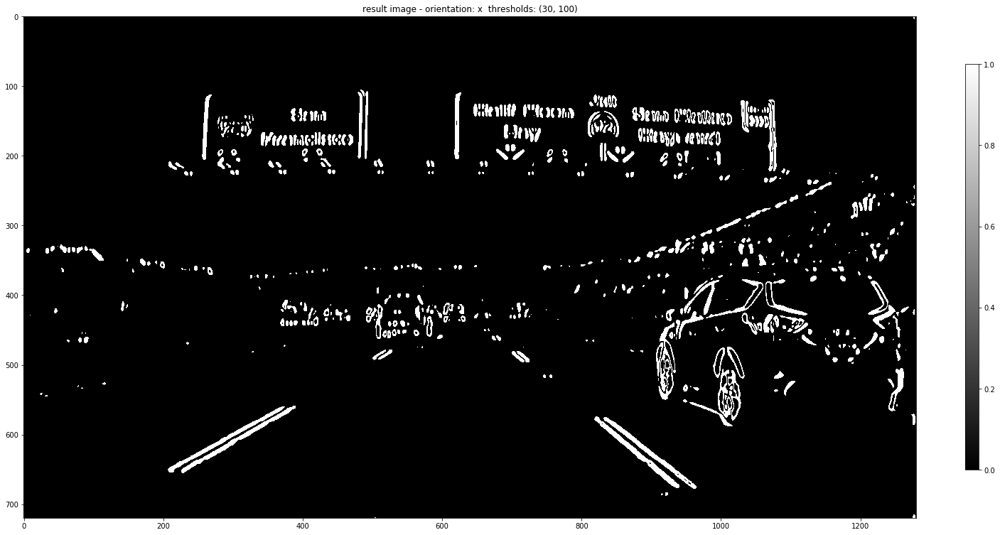

In [189]:
# Run the function
# grad_x_thr = (40,90)
grad_x_thr = (30,100)
# grad_x_thr = (20,155)
grad_binary = abs_sobel_thresh(image, orient='x', sobel_kernel= 19 ,thresh=grad_x_thr, display= True)


### y sobel detections

0 1
sobel       :  (720, 1280) -5464059426.20616 5979219787.512955
scaled_sobel:  (720, 1280) 0 255
abs_sobel   :  (720, 1280) 0.0 5979219787.512955


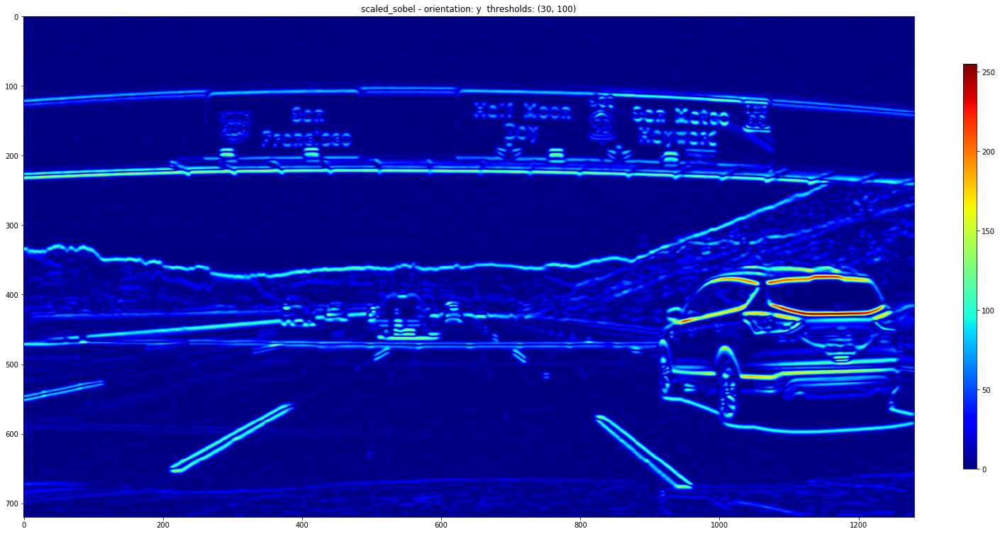

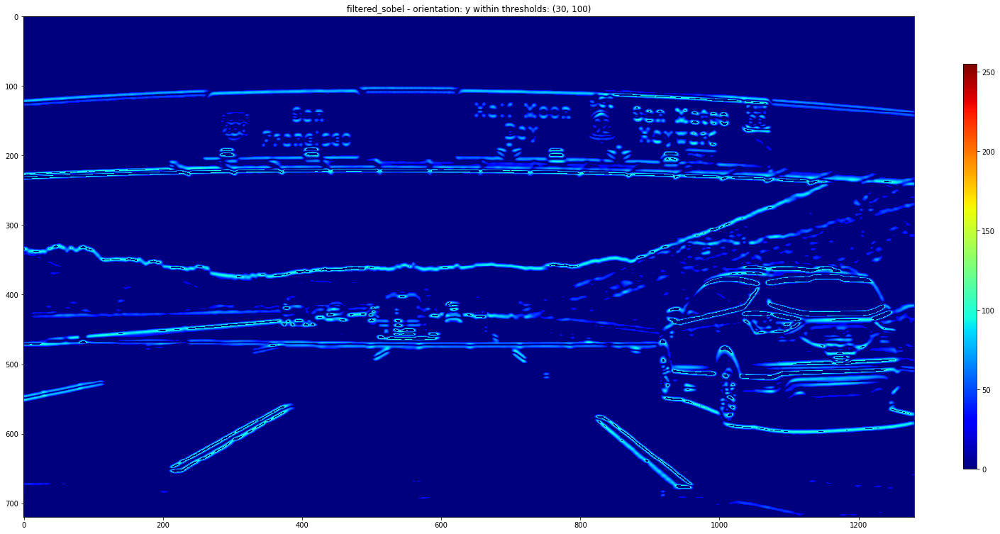

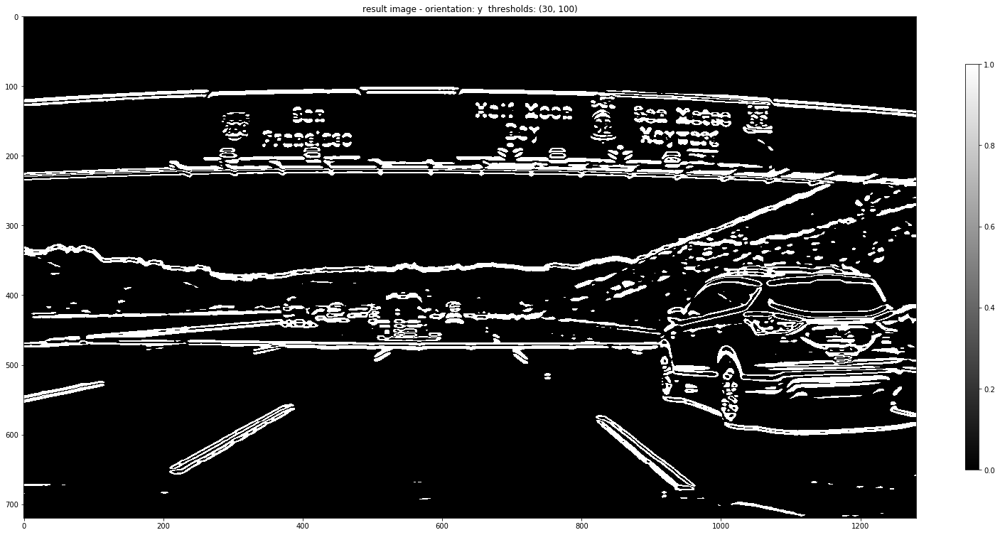

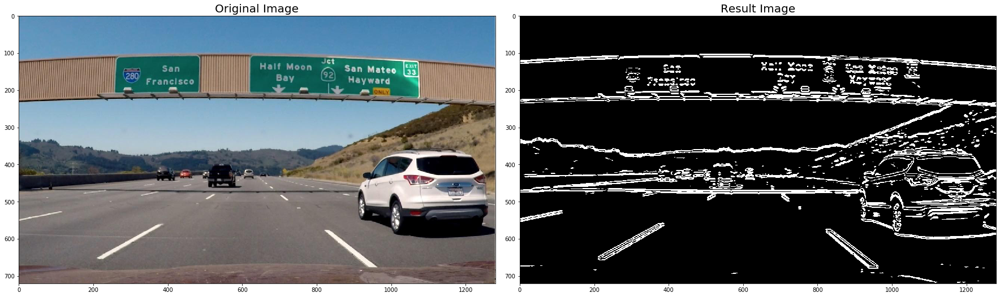

In [197]:
# Run the function
grad_y_thr = (30,100)
grad_binary = abs_sobel_thresh(image, orient='y', sobel_kernel=19 ,thresh=grad_y_thr, display= True)

# Plot the result
display_two(image, grad_binary)

In [185]:
# # Run the function
# grad_y_thr = (20,100)
# grad_binary = abs_sobel_thresh(image, orient='y', sobel_kernel=19, thresh=grad_y_thr, display = True)


# # Plot the result
# display_two(image, grad_binary)


### Combine x and y sobel detections

1 0
sobel       :  (720, 1280) -5430653902.976696 4479259918.09369
scaled_sobel:  (720, 1280) 0 254
abs_sobel   :  (720, 1280) 0.0 5430653902.976696
0 1
sobel       :  (720, 1280) -5464059426.20616 5979219787.512955
scaled_sobel:  (720, 1280) 0 255
abs_sobel   :  (720, 1280) 0.0 5979219787.512955


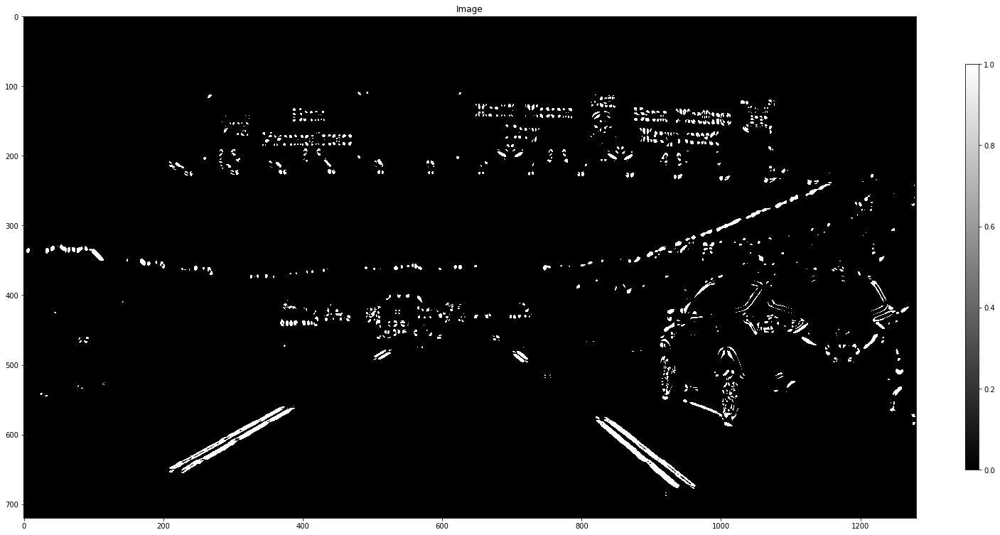

In [193]:
ksize = 19 # Choose a larger odd number to smooth gradient measurements
grad_x_thr = (30,100)
grad_y_thr = (30,110)

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=grad_x_thr)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=grad_y_thr)

combined = np.zeros_like(gradx)
combined[((gradx == 1) & (grady == 1)) ] = 1

display_one(combined)
# fig = plt.figure(figsize=(20,15))
# plt.imshow(combined, cmap = 'gray'); plt.title(' mag_binary: '+str(mag_thr))
# plt.show()

## `mag_thresh()` - Magnitude of Gradient Function

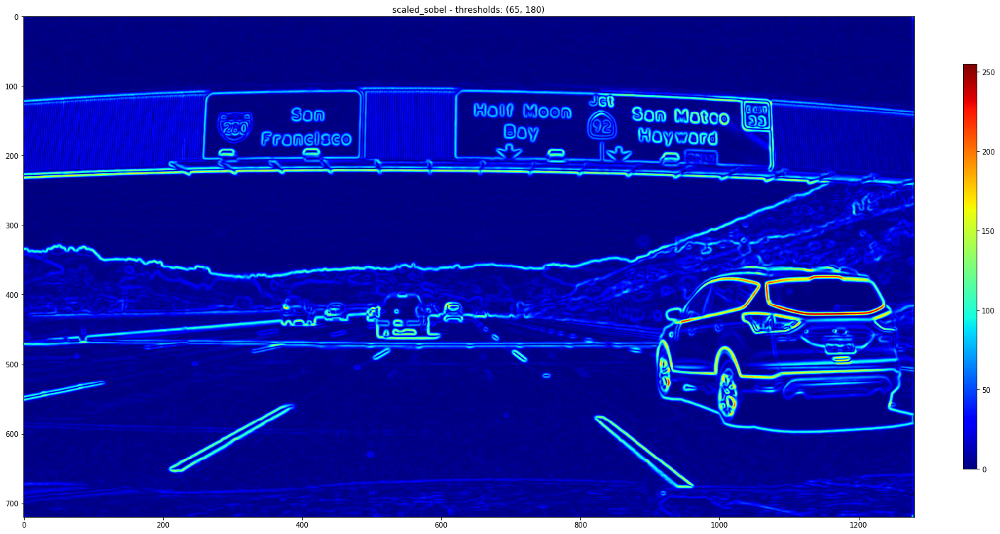

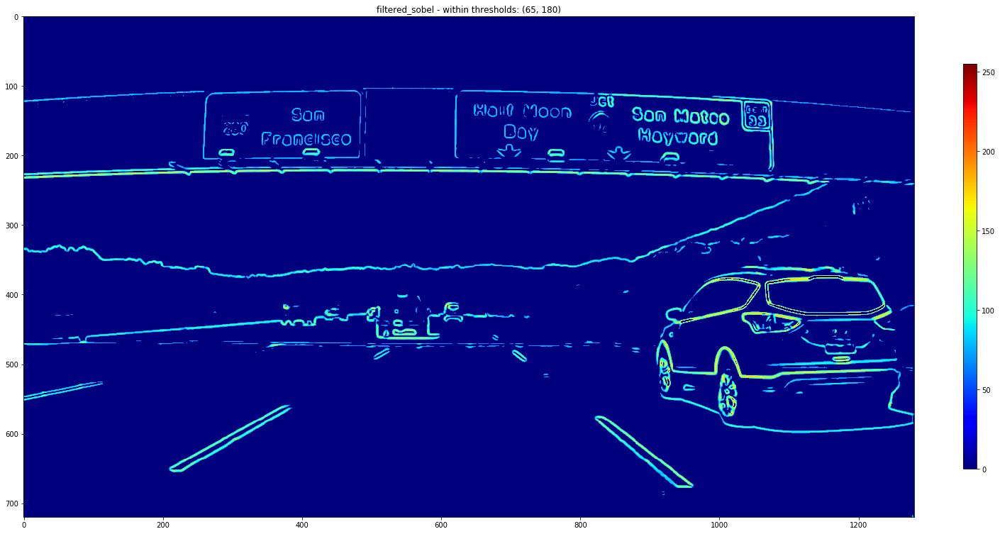

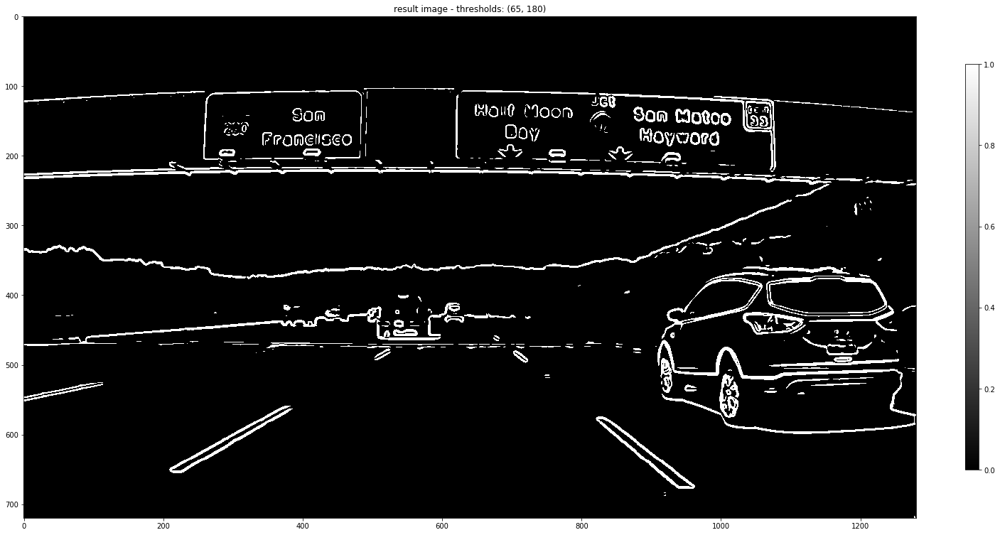

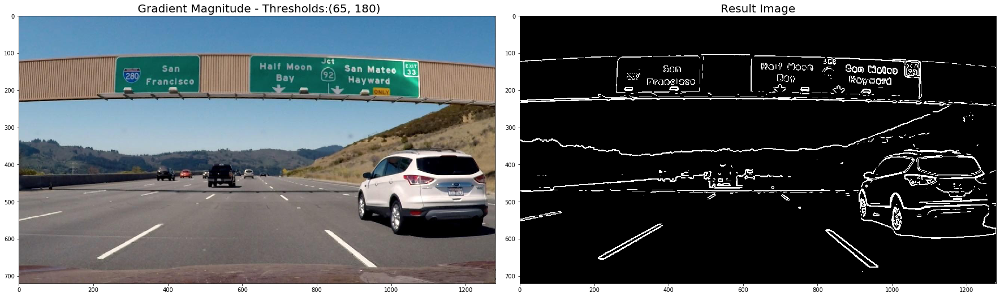

In [172]:
# Run the function
mag_thr = (65, 180)
mag_binary = mag_thresh(image, sobel_kernel=11, thresh=mag_thr, display=True)
display_two(image, mag_binary, ' Gradient Magnitude - Thresholds:'+str(mag_thr))

## `dir_threshold()`

grad_dir: (720, 1280) 0.0 1.5707963267948966


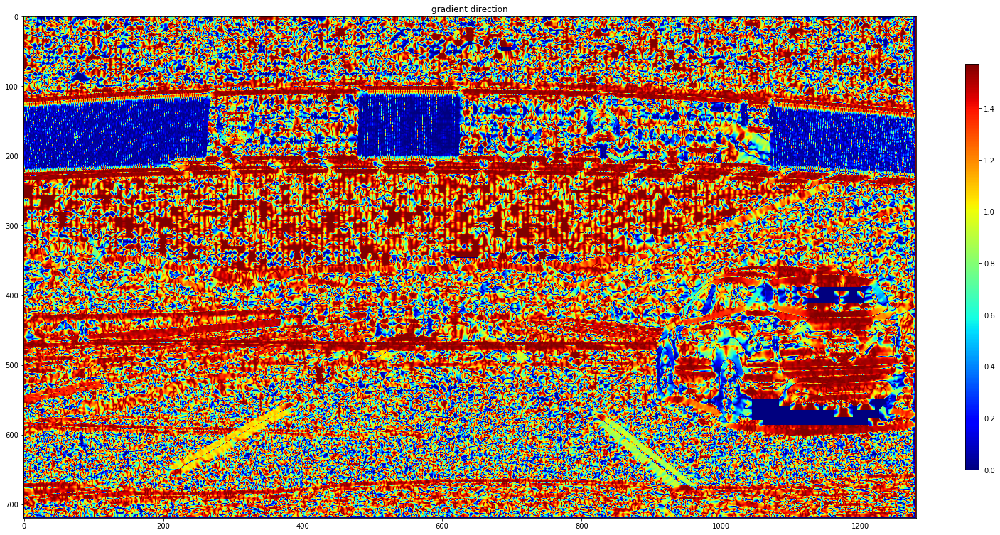

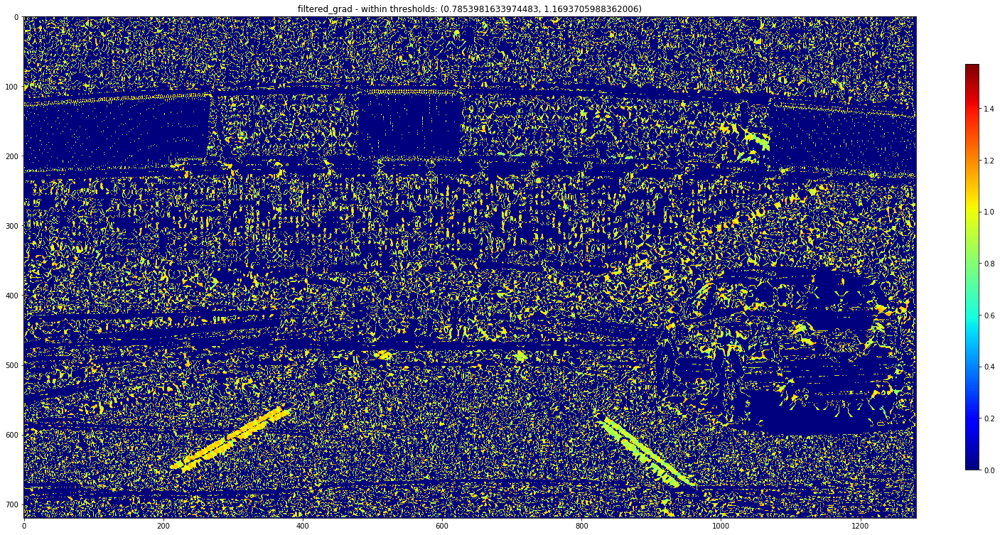

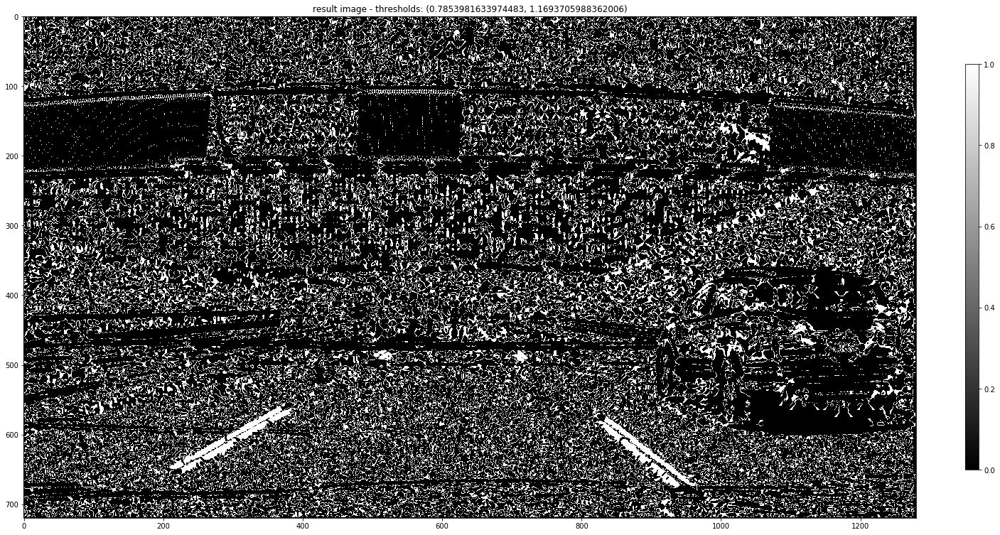

 theta1 =  0.7853981633974483  theta2 =  1.1693705988362006


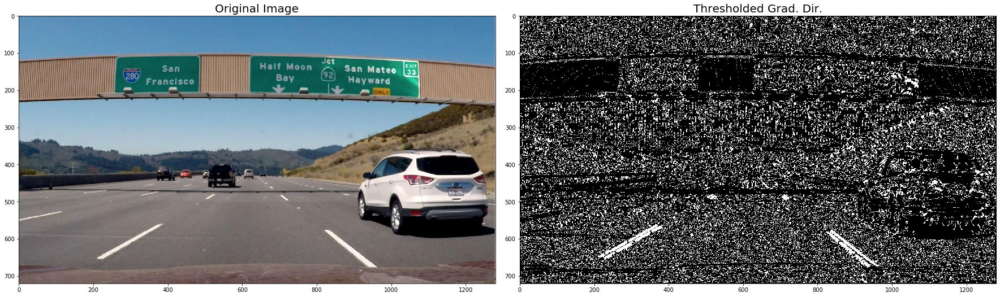

In [177]:
# Run the function
theta1 = deg2rad(45)
theta2 = deg2rad(67)
dir_binary = dir_threshold(image, sobel_kernel=11, thresh=(theta1, theta2), display = True)
print(' theta1 = ', theta1, ' theta2 = ', theta2)
display_two(image, dir_binary, title2 = 'Thresholded Grad. Dir.')

(1.4835298641951802, 1.6580627893946132)
40.10704565915762 68.18197762056796
grad_dir: (720, 1280) 0.0 1.5707963267948966


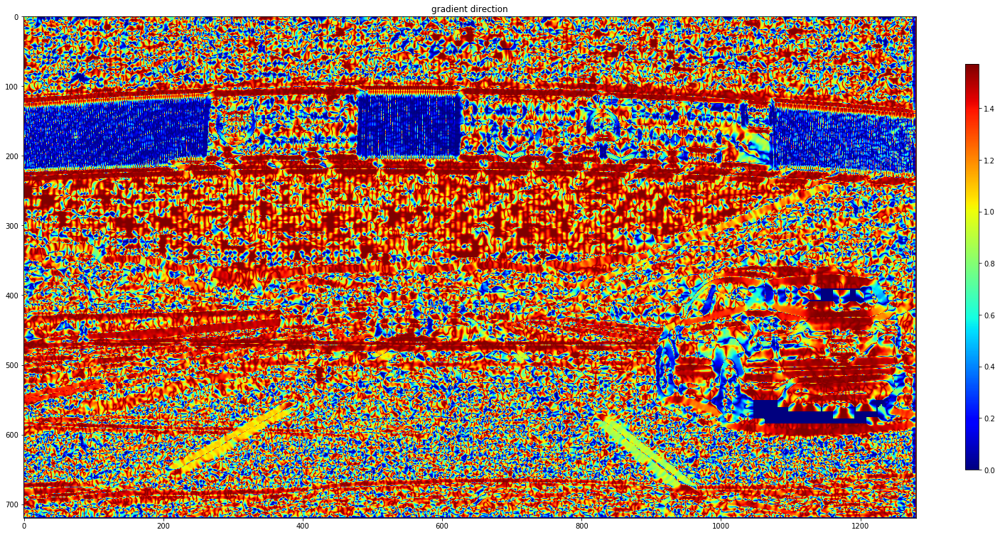

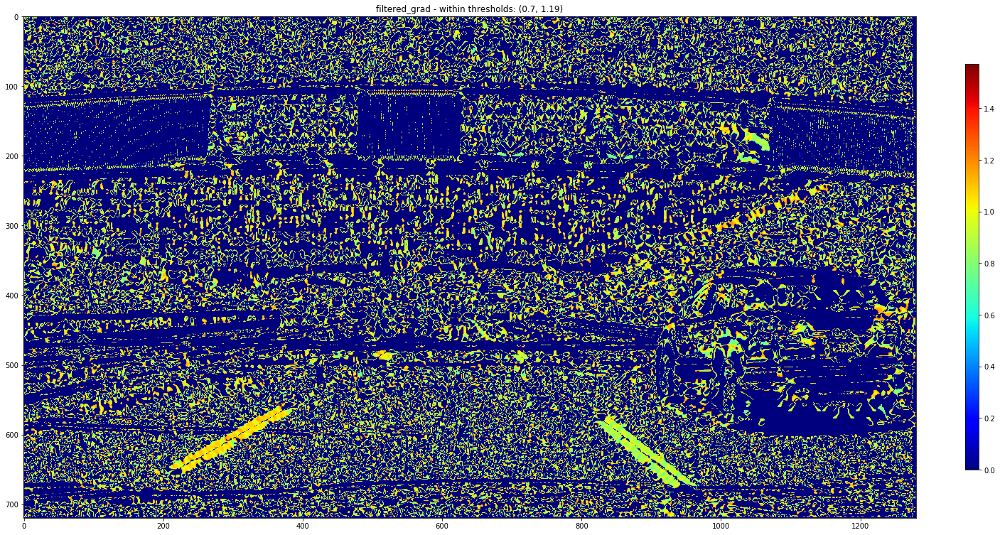

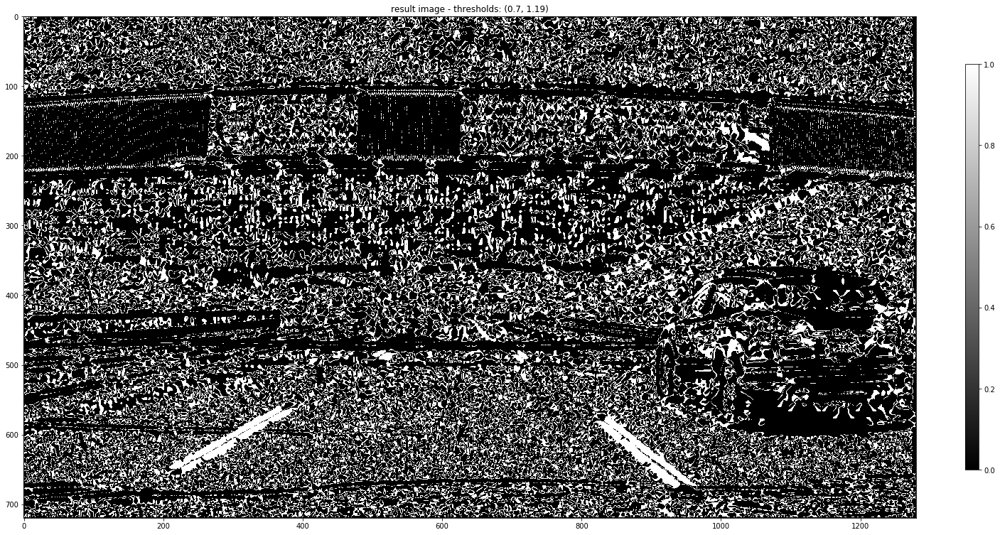

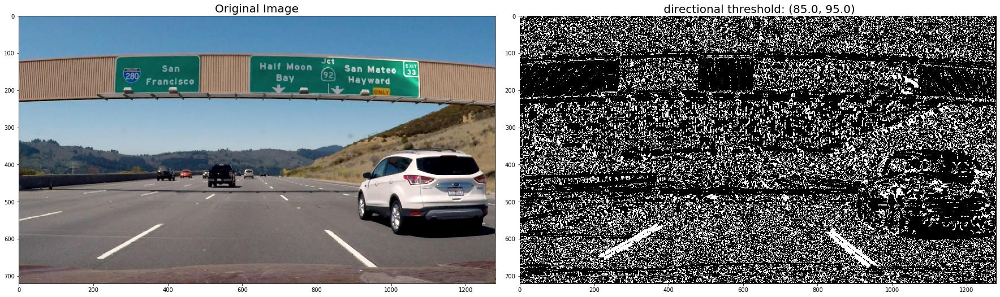

In [147]:
theta1  = deg2rad(85)
theta2  = deg2rad(95)
dir_thr = (theta1, theta2)
print(dir_thr)
print(rad2deg(0.7), rad2deg(1.19))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7,1.19), display = True)

display_two(image, dir_binary, title2=' directional threshold: ('+str(rad2deg(dir_thr[0]))+', '+str(rad2deg(dir_thr[1]))+')')


## Combine multiple functions

1 0
sobel       :  (720, 1280) -5430653902.976696 4479259918.09369
scaled_sobel:  (720, 1280) 0 254
abs_sobel   :  (720, 1280) 0.0 5430653902.976696
0 1
sobel       :  (720, 1280) -5464059426.20616 5979219787.512955
scaled_sobel:  (720, 1280) 0 255
abs_sobel   :  (720, 1280) 0.0 5979219787.512955
grad_dir: (720, 1280) 0.0 1.5707963267948966


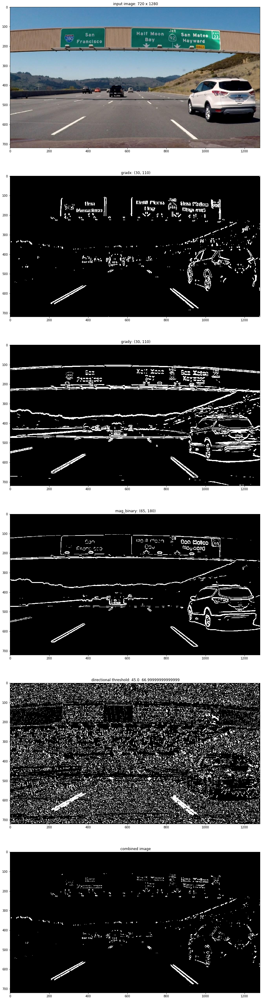

In [198]:
image = mpimg.imread('signs_vehicles_xygrad.png')

# Choose a Sobel kernel size
ksize = 19 # Choose a larger odd number to smooth gradient measurements
# grad_x_thr = (70,100)
# grad_y_thr = (80,155)
grad_x_thr = (30,110)
grad_y_thr = (30,110)

# mag_thr = (90,160)
mag_thr = (65,180)

theta1  = 45
theta2  = 67
dir_thr = (deg2rad(theta1), deg2rad(theta2))

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=grad_x_thr)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=grad_y_thr)

mag_binary = mag_thresh(image, sobel_kernel=ksize, thresh=mag_thr)

dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=dir_thr)

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

## Display intermediate results
fig = plt.figure(figsize=(25,60))
plt.subplot(611);plt.imshow(image); plt.title(' input image: '+str(image.shape[0])+' x '+str(image.shape[1]))
plt.subplot(612);plt.imshow(gradx, cmap = 'gray'); plt.title(' gradx: '+str(grad_x_thr))
plt.subplot(613);plt.imshow(grady, cmap = 'gray'); plt.title(' grady: '+str(grad_y_thr))
plt.subplot(614);plt.imshow(mag_binary, cmap = 'gray'); plt.title(' mag_binary: '+str(mag_thr))
plt.subplot(615);plt.imshow(dir_binary, cmap = 'gray'); plt.title(' directional threshold: '+str(rad2deg(dir_thr[0]))+'  '+str(rad2deg(dir_thr[1])))
plt.subplot(616);plt.imshow(combined, cmap='gray' ); plt.title(' combined image')
plt.show()


In [200]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

# Read in an image, you can also try test1.jpg or test4.jpg
image = mpimg.imread('test6.jpg') 

# TODO: Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    # 2) Apply a threshold to the S channel
    # 3) Return a binary image of threshold result
    hlsImage = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    print(hlsImage.shape)
    s_channel = hlsImage[:,:,-1]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel >= thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output
    

(720, 1280, 3)


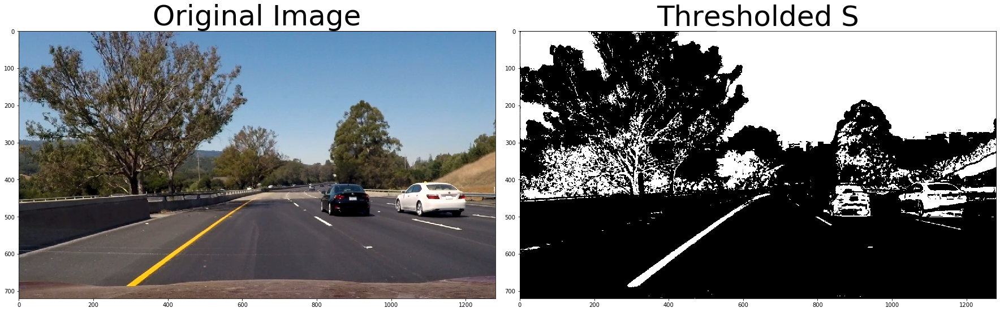

In [201]:
# Optional TODO - tune the threshold to try to match the above image!    
hls_binary = hls_select(image, thresh=(80, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)